# Project: Tracking Pedestrians on crowded crossing road

* Author: Ninh Giang Nguyen

* Objectives: Real-Time Pedestrian and Vehicle Detection & Tracking at Urban Intersections

## Phase 1: Collect data, set up the environment, test pretrained YOLOv8 on sample video.

* Code file: [logic](test_yolo_pretrained.py)
* On termimal, 
- For detection on image, run this command 
```
yolo detect predict model=yolov8n.pt source=data/images/frame_002.png
```
Example Result: 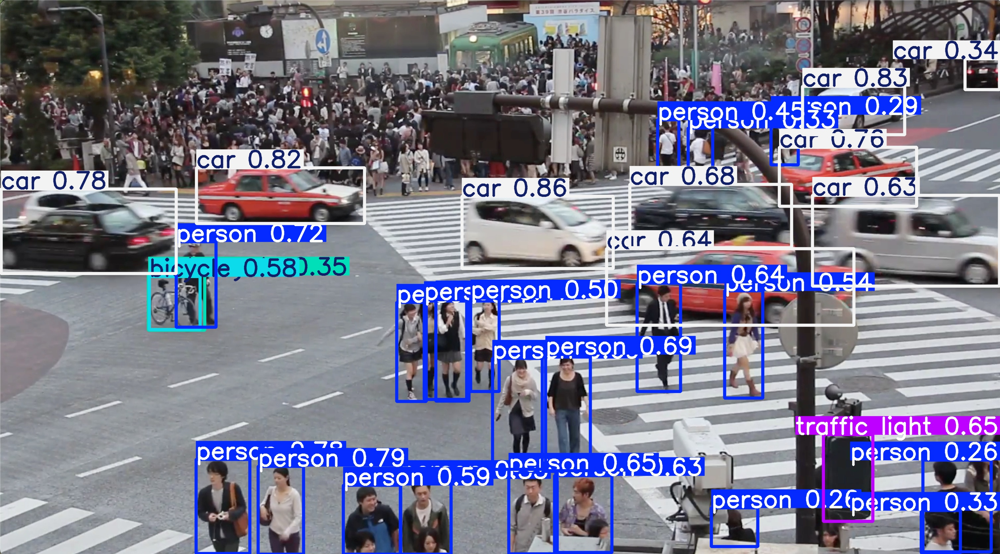
- For detection on video, run this command 
```
python -m venv venv
source venv/bin/activate
pip install -r requirement.txt

python3 test_yolo_pretrained.py
```



<video controls src='result/resultant_video_from_pretrained_YOLO8_model.mp4' title="Title"></video>

## Phase 2: Annotate additional data with RoboFlow Annotator
* Although previoius YOLOv8 pretrained on COCO already detects person, car, bus,...those models are trained on generic environments.

* Because my footage of Shibuya crossing videos looks different — unusual lighting, crowd density, camera angle — so I fine-tune YOLOv8 for higher accuracy.

### 0. Leverage Roboflow website 

* I input the video into the website, then I bound some examples of object and name it myself then ask the website to learn it. At the end when I achieved the moderately good detection, I extract that learner through API
* Expected performance: 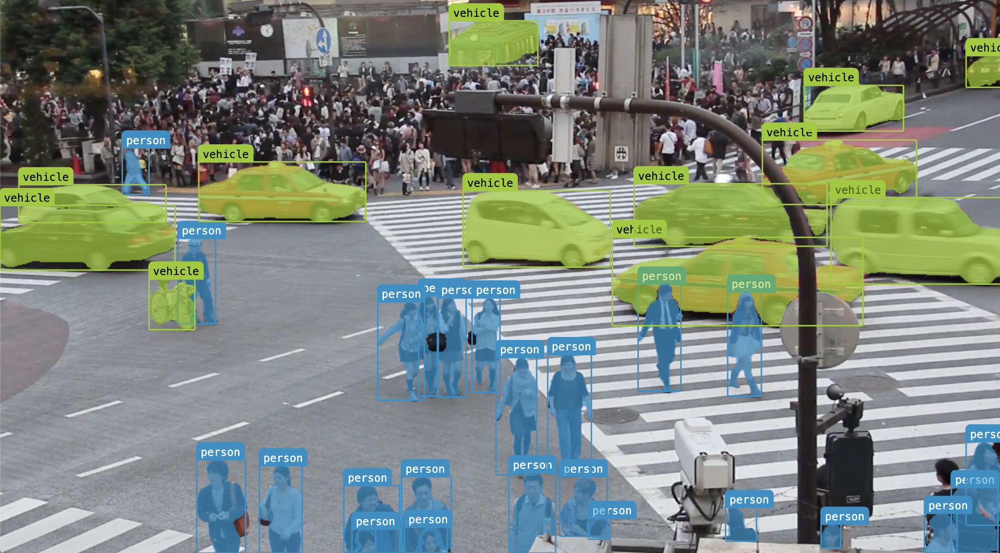
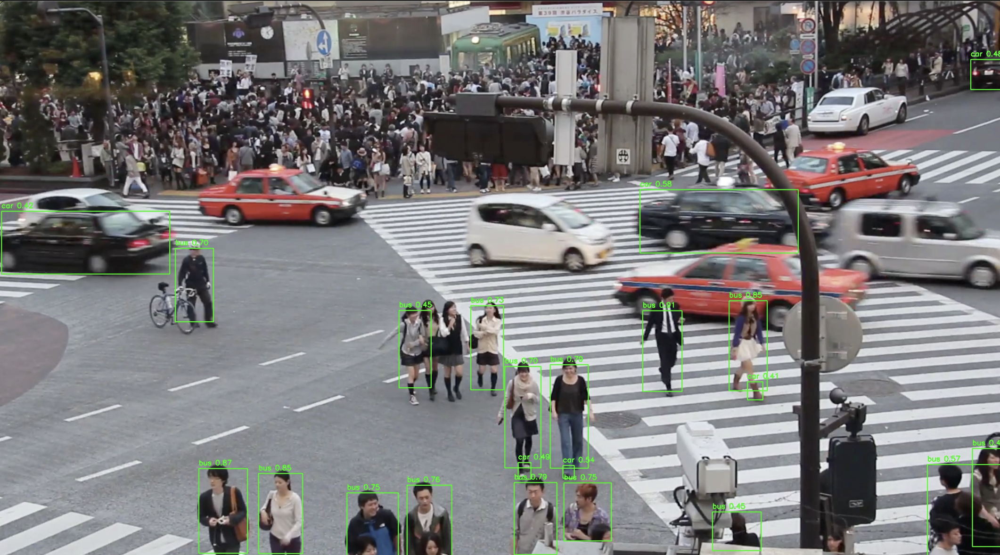

In [35]:
import download_dataset
import base64
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

### 1. Retrieve API URL and KEY from roboflow website
* Extract the learner that do the dectection task as above

In [37]:
api_url="https://serverless.roboflow.com"
api_key="3QOnBq7edk77uQnLAI3x"

image_path = "data/images/frame_001.png"
workspace_name="computer-vision-personal-project"
workflow_id="find-people-and-vehicles-4"


client = download_dataset.getClient(api_url, api_key)
result = download_dataset.getResult(image_path, client, workspace_name, workflow_id)

In [38]:
import pprint

# Check keys of the first result
pprint.pprint(result[0].keys())

dict_keys(['predictions', 'visualization'])


In [39]:
from pprint import pprint

# Inspect the predictions dictionary fully
pprint(result[0]['predictions'])

{'image': {'height': 1672, 'width': 3016},
 'predictions': [{'class': 'person',
                  'class_id': 0,
                  'confidence': 0.78515625,
                  'detection_id': '9a541ab9-4cad-456a-aad4-d472762b5724',
                  'height': 105.0,
                  'parent_id': 'image',
                  'points': [{'x': 992.0, 'y': 1566.0},
                             {'x': 991.0, 'y': 1567.0},
                             {'x': 987.0, 'y': 1567.0},
                             {'x': 986.0, 'y': 1568.0},
                             {'x': 985.0, 'y': 1568.0},
                             {'x': 984.0, 'y': 1569.0},
                             {'x': 983.0, 'y': 1569.0},
                             {'x': 981.0, 'y': 1571.0},
                             {'x': 980.0, 'y': 1571.0},
                             {'x': 978.0, 'y': 1573.0},
                             {'x': 978.0, 'y': 1574.0},
                             {'x': 977.0, 'y': 1575.0},
                      

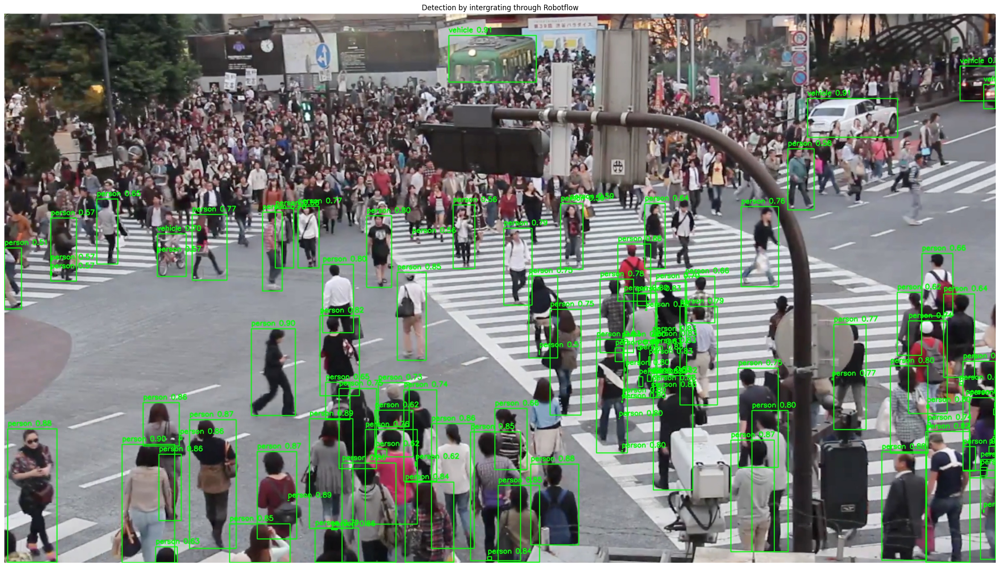

In [64]:
image = cv2.imread(image_path)

detections = result[0]['predictions']['predictions']

for det in detections:
    x, y = int(det['x']), int(det['y'])
    w, h = int(det['width']), int(det['height'])
    label = f"{det['class']} {det['confidence']:.2f}"

    # Draw bounding box
    cv2.rectangle(image, (x-w//2, y-h//2), (x + w//2, y + h//2), (0, 255, 0), 2)
    # Put label text
    cv2.putText(image, label, (x -w//2 , y-h//2 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)

# display
output_path = "result/output_image.jpg"
cv2.imwrite(output_path, image)
image = cv2.imread("result/output_image.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(30,60))
plt.imshow(image)
plt.title('Detection by intergrating through Robotflow')
plt.axis('off')
plt.show()

* This is absolultely cinematic :). Correct detection and clasification (no including occluded objects)

## Phase 3: Fine-tune pretrained YOLO8

* Even though pretrained YOLO8 worked very well and recognizing and detecting objects, however, It couldn't detect partially occluded person/object to well. I fine-tune it with the hope that it can improve this aspect, but this is just my guess

* Run this command
```
yolo detect train \
  model=yolov8n.pt \
  data=data/data.yaml \
  epochs=50 \
  imgsz=640 \
  batch=16 \
  lr0=0.001
```
* Traning result: 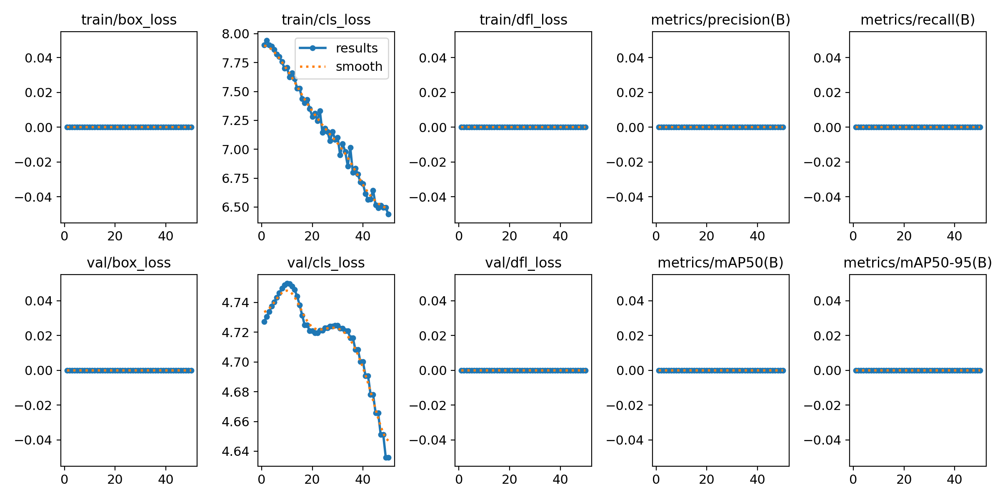

* Test it with different sample by running this on terminal 
```
yolo detect predict \
  model=runs/detect/train3/weights/best.pt \
  source="test_images/"
```
* result (saved as /runs/detect/predict2): not as expected = > ask professor 

## Phase 4: Integrate YOLOv8 with DeepSORT and Botsort
* Since Fine-tune doesn't work at the moment, I take those as alternatives. Since YOLOv8 already has built-in tracking of DeepSORT & ByteTrack, we can can use it right away

* With Bytrack 
```
yolo track model=yolov8n.pt tracker=bytetrack.yaml source=data/videos/shibuya_crossing_normal_speed.mov
```
or 
```
yolo track model=yolov8s.pt tracker=bytetrack.yaml source=data/videos/shibuya_crossing_normal_speed.mov
```
Resultant video: <video controls src="runs/detect/track6/shibuya_crossing_normal_speed.mp4" title="Title"></video>

## Phase 5: Evaluate Performance

* With Botsort
```
yolo track model=yolov8n.pt tracker=botsort.yaml source=data/videos/shibuya_crossing_normal_speed.mov
```
or
```
yolo track model=yolov8s.pt tracker=botsort.yaml source=data/videos/shibuya_crossing_normal_speed.mov
```
Resultant video: <video controls src="runs/detect/track7/shibuya_crossing_normal_speed.mp4" title="Title"></video>

Most ideally, we have to evaluate 5 training model
- Pretrained YOLO8 model: yolov8s.pt    ('s' in small)
- Pretrained YOLO8 with fine-tune model: yolov8n.pt     ('n' in nano)
- Roboflow annotator model: model with external API support
- YOLO8 with ByTrack model: model with ByTrack optimizer
- YOLO8 with Botsort model: model with Botsort optimizer 

However, due to incompatible format problem and time limitation, I just can evaluate yolov8s.pt  and  yolov8n.pt

### 1. Evaluate detection

* Utilize Yolo's built in val() to Validate on COCO validation set

In [62]:
from ultralytics import YOLO

model = YOLO('yolov8n.pt')

results = model.val(
    data='coco.yaml',
    split='val',
    fraction=0.1,
    device='mps',
    batch=16
)

print(f"mAP50: {results.box.map50:.3f}")

Ultralytics 8.3.207 🚀 Python-3.12.2 torch-2.8.0 MPS (Apple M2 Pro)
YOLOv8n summary (fused): 72 layers, 3,151,904 parameters, 0 gradients, 8.7 GFLOPs
val: Fast image access ✅ (ping: 0.2±0.5 ms, read: 502.9±167.5 MB/s, size: 141.0 KB)
val: Scanning /Users/ninhgiangnguyen/Desktop/CS366/TrackingPedestrians/datasets/coco/labels/val2017... 4952 images, 48 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 5000/5000 3.4Kit/s 1.5s0.1s
val: New cache created: /Users/ninhgiangnguyen/Desktop/CS366/TrackingPedestrians/datasets/coco/labels/val2017.cache


MPS: nonzero op is supported natively starting from macOS 14.0. Falling back on CPU. This may have performance implications. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/aten/src/ATen/native/mps/operations/Indexing.mm:452.)


WARNING ⚠️ NMS time limit 2.800s exceeded
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 62% ━━━━━━━───── 194/313 0.2it/s 14:05<9:280WARNING ⚠️ NMS time limit 2.800s exceeded
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 198/313 0.2it/s 14:27<9:453WARNING ⚠️ NMS time limit 2.800s exceeded
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 229/313 0.1it/s 18:15<9:357WARNING ⚠️ NMS time limit 2.800s exceeded
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 73% ━━━━━━━━╸─── 230/313 0.1it/s 18:22<9:35WARNING ⚠️ NMS time limit 2.800s exceeded
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 231/313 0.1it/s 18:29<9:24WARNING ⚠️ NMS time limit 2.800s exceeded
                 Class     Images  Instances      Box(P          R      mAP50  m

/bin/sh: /Users/ninhgiangnguyen/Desktop/CS366/TrackingPedestrians/yolo_env/bin/pip: /Users/ninhgiangnguyen/Desktop/TrackingPedestrians/yolo_env/bin/python: bad interpreter: No such file or directory


WARNING ⚠️ Retry 2/2 failed: Command 'pip install --no-cache-dir "faster-coco-eval>=1.6.7" ' returned non-zero exit status 126.
WARNING ⚠️ requirements: ❌ Command 'pip install --no-cache-dir "faster-coco-eval>=1.6.7" ' returned non-zero exit status 126.
WARNING ⚠️ faster-coco-eval unable to run: No module named 'faster_coco_eval'
Results saved to /Users/ninhgiangnguyen/Desktop/CS366/TrackingPedestrians/runs/detect/val3


/bin/sh: /Users/ninhgiangnguyen/Desktop/CS366/TrackingPedestrians/yolo_env/bin/pip: /Users/ninhgiangnguyen/Desktop/TrackingPedestrians/yolo_env/bin/python: bad interpreter: No such file or directory


mAP50: 0.479


In [3]:
from ultralytics import YOLO

model = YOLO('yolov8s.pt')

results = model.val(
    data='coco128.yaml',
    split='val',
    fraction=0.1,
    device='mps',
    batch=16
)

print(f"mAP50: {results.box.map50:.3f}")

Ultralytics 8.3.207 🚀 Python-3.12.2 torch-2.8.0 MPS (Apple M2 Pro)
YOLOv8s summary (fused): 72 layers, 11,156,544 parameters, 0 gradients, 28.6 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 251.9±120.9 MB/s, size: 60.3 KB)
val: Scanning /Users/ninhgiangnguyen/Desktop/CS366/TrackingPedestrians/datasets/coco128/labels/train2017.cache... 126 images, 2 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 128/128 383.2Kit/s 0.0s


/Users/ninhgiangnguyen/Desktop/TrackingPedestrians/yolo_env/lib/python3.12/site-packages/ultralytics/utils/nms.py:96: UserWarning: MPS: nonzero op is supported natively starting from macOS 14.0. Falling back on CPU. This may have performance implications. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/aten/src/ATen/native/mps/operations/Indexing.mm:452.)
  x = x[filt]


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 0.6it/s 13.9s2.0s
                   all        128        929      0.797      0.664       0.76      0.589
                person         61        254      0.922      0.681      0.827      0.624
               bicycle          3          6          1      0.322      0.451      0.267
                   car         12         46      0.891      0.217        0.4       0.23
            motorcycle          4          5      0.793      0.773      0.928       0.78
              airplane          5          6      0.864          1      0.995      0.836
                   bus          5          7      0.802      0.714        0.8      0.721
                 train          3          3      0.732          1      0.995      0.852
                 truck          5         12      0.716      0.417      0.546      0.324
                  boat          2          6      0.764      0.547   

### Executive Summary

Evaluated YOLOv8n (nano) model on COCO validation dataset subset. The model demonstrates **moderate performance** with an mAP@0.5 of **47.9%**, suitable for real-time pedestrian and vehicle tracking applications with some limitations.

### Performance Metrics

| Metric | Value | Interpretation |
|--------|-------|----------------|
| **mAP@0.5** | 47.9% for yolov8n.pt and 76% for yolov8s.pt| Moderate to high detection accuracy across all classes |
| **Best F1-Score** | 0.50 at conf=0.233 | Optimal balance between precision and recall |
| **Maximum Precision** | 1.00 at conf=1.000 | High confidence predictions are very accurate |
| **Maximum Recall** | 0.70 at conf=0.000 | Detects up to 70% of objects present |


### Key Findings

* Strengths 
- **Low class confusion**: Minimal misclassification between object categories
- **High precision potential**: Achieves near-perfect precision at high confidence thresholds
- **Real-time capable**: Lightweight model suitable for edge deployment
- **Strong on common classes**: Excellent performance on persons, vehicles, and large objects

* Limitations 
- **Moderate overall accuracy**: 47.9% mAP indicates room for improvement
- **30% missed detections**: Even at zero confidence threshold, model fails to detect 30% of objects
- **Class imbalance**: Performance varies significantly across different object categories
- **Low optimal F1**: Peak F1-score of 0.50 suggests difficulty balancing precision and recall

### Curve Analysis Summary

* 1. F1-Confidence Curve

- **Optimal operating point**: confidence threshold = 0.23
- F1 score stable between 0.1-0.4 confidence range
- Performance degrades rapidly above 0.5 confidence

* 2. Precision-Confidence Curve

- **High recall mode** (conf=0.2): Catch more objects, accept false positives
- **High precision mode** (conf=0.5): Fewer false alarms, miss some objects
- **Balanced mode** (conf=0.23): Optimal F1-score

* 3. Precision-Recall Curve

- Area under curve (mAP@0.5) = 0.479
- Clear precision-recall trade-off visible
- Individual class performance varies significantly (gray lines)

* 4. Recall-Confidence Curve

- Maximum recall: 70% at zero confidence
- Steady decline as confidence threshold increases
- Indicates 30% of objects inherently difficult to detect

* 5. Confusion Matrix
**Insights:**
- Strong diagonal pattern indicates good class discrimination
- Most errors are false negatives (missed detections) rather than misclassifications
- **Best performance**: person, car, truck, motorcycle, bicycle
- **Weakest performance**: small objects, rare classes, occluded items

# Phase 6: Extension

### 1. Extract some frames for manually evaluating

In [63]:
import evaluation_frame

eval = evaluation_frame.extract_evaluation_frames(
    "data/videos/shibuya_crossing.mp4",
    "data/eval_frames",
    num_frames=50
)

Extracted 50 frames to data/eval_frames


In [65]:
from roboflow import Roboflow

rf = Roboflow(api_key="3QOnBq7edk77uQnLAI3x")
project = rf.workspace("computer-vision-personal-project").project("shibuya-evaluation-4fwum")
version = project.version(1)
dataset = version.download("yolov5")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to shibuya-evaluation-1 in yolov5pytorch:: 100%|██████████| 112/112 [00:00<00:00, 1422.31it/s]


### 2. Processing on another (but fast speed) video

In [4]:
import preprocessing

preprocessing.preprocess_video('data/videos/shibuya_crossing.mp4', 'data/videos/shibuya_crossing_speed_down.mp4')

Original FPS: 60.0
Saved: data/videos/shibuya_crossing_speed_down.mp4
